In [11]:
'''
import required packages
'''

import math

#import numpy as n_
#import pylab as p_
import random

import cv2 as cv

import numpy as np

from tqdm import tqdm

from math import cos,sqrt,pi

import matplotlib.pyplot as plt

from scipy.signal import gaussian # 也許可被取代

In [12]:
'''
This class is mainly used to "Read" image.
REF: HW1
'''
class JJCV_Read_Draw():

    def __init__(self, cmap):
        self.cmap = cmap
    
    def common_read(self, img_path, mode):
        if mode == "bmp":
            img = cv.imread(img_path)[:,:,0]
        elif mode == "raw":
            img = self.private_jj_imread(img_path)
        return img
    
    def common_draw(self, img, axis_toggle):
        plt.figure(figsize=(5,5))
        plt.imshow(img, cmap=self.cmap)
        if axis_toggle:
            plt.axis("off")
        plt.show()
            
    def read_and_draw(self, img_path, mode):

        img = self.common_read(img_path, mode)
        self.common_draw(img, True)
        #self.common_draw(self.private_get_center_area(img, 512,10), True)
        
        return np.array(img)

    def private_jj_imread(self, img_path):
        img = np.empty((512, 512), np.uint8)
        file = open(img_path, "rb").read()

        for x in range(512):
            for y in range(512):
                img[x, y] = file[x * 512 + y]
        return img

    # for square
    def private_get_center_area(self, img, img_size, center_size):
        mid = float(img_size)/2.
        half = center_size/2
        upper_bound = int(mid) + int(half) 
        lower_bound = int(mid) - int(half)
        return img[lower_bound:upper_bound, lower_bound:upper_bound]
    
    # for rectangle
    def private_get_center_area_2(self, img, img_height, img_width, center_size):
        vertical_mid = float(img_height)/2.
        horizontal_mid = float(img_width)/2.
        half = center_size/2
        
        vertical_upper_bound = int(vertical_mid) + int(half) 
        vertical_lower_bound = int(vertical_mid) - int(half)
        
        horizontal_upper_bound = int(horizontal_mid) + int(half) 
        horizontal_lower_bound = int(horizontal_mid) - int(half)
        return img[vertical_lower_bound:vertical_upper_bound, horizontal_lower_bound:horizontal_upper_bound]

In [64]:
'''
This class is used to "perform DFT and iDFT"
Most functions are ref from "https://github.com/raoofnaushad"
As Wiener Filter is ref from https://github.com/tranleanh/wiener-filter-image-restoration
which modified a bit to fit our purpose
'''
class Github_Fourier_Transform():
    
    def __init__(self):
        pass
    
    def DFT_1D(self, fx):
        fx = np.asarray(fx, dtype=complex)
        M = fx.shape[0]
        fu = fx.copy()

        for i in range(M):
            u = i
            sum = 0
            for j in range(M):
                x = j
                tmp = fx[x]*np.exp(-2j*np.pi*x*u*np.divide(1, M, dtype=complex))
                sum += tmp
            fu[u] = sum
        return fu


    def inverseDFT_1D(self, fu):
        fu = np.asarray(fu, dtype=complex)
        M = fu.shape[0]
        fx = np.zeros(M, dtype=complex)

        for i in range(M):
            x = i
            sum = 0
            for j in range(M):
                u = j
                tmp = fu[u]*np.exp(2j*np.pi*x*u*np.divide(1, M, dtype=complex))
                sum += tmp
            fx[x] = np.divide(sum, M, dtype=complex)
        return fx


    def FFT_1D(self, fx):
        """ use recursive method to speed up"""
        fx = np.asarray(fx, dtype=complex)
        M = fx.shape[0]
        minDivideSize = 4

        if M % 2 != 0:
            raise ValueError("the input size must be 2^n")

        if M <= minDivideSize:
            return self.DFT_1D(fx)
        else:
            fx_even = self.FFT_1D(fx[::2])  # compute the even part
            fx_odd = self.FFT_1D(fx[1::2])  # compute the odd part
            W_ux_2k = np.exp(-2j * np.pi * np.arange(M) / M)

            f_u = fx_even + fx_odd * W_ux_2k[:M//2]

            f_u_plus_k = fx_even + fx_odd * W_ux_2k[M//2:]

            fu = np.concatenate([f_u, f_u_plus_k])

        return fu


    def inverseFFT_1D(self, fu):
        """ use recursive method to speed up"""
        fu = np.asarray(fu, dtype=complex)
        fu_conjugate = np.conjugate(fu)

        fx = self.FFT_1D(fu_conjugate)

        fx = np.conjugate(fx)
        fx = fx / fu.shape[0]

        return fx


    def FFT_2D(self, fx):
        h, w = fx.shape[0], fx.shape[1]

        fu = np.zeros(fx.shape, dtype=complex)

        if len(fx.shape) == 2:
            for i in range(h):
                fu[i, :] = self.FFT_1D(fx[i, :])

            for i in range(w):
                fu[:, i] = self.FFT_1D(fu[:, i])
        elif len(fx.shape) == 3:
            for ch in range(3):
                fu[:, :, ch] = self.FFT_2D(fx[:, :, ch])

        return fu


    def inverseDFT_2D(self, fu):
        h, w = fu.shape[0], fu.shape[1]

        fx = np.zeros(fu.shape, dtype=complex)

        if len(fu.shape) == 2:
            for i in range(h):
                fx[i, :] = self.inverseDFT_1D(fu[i, :])

            for i in range(w):
                fx[:, i] = self.inverseDFT_1D(fx[:, i])

        elif len(fu.shape) == 3:
            for ch in range(3):
                fx[:, :, ch] = self.inverseDFT_2D(fu[:, :, ch])

        fx = np.real(fx)
        return fx


    def inverseFFT_2D(self, fu):
        h, w = fu.shape[0], fu.shape[1]

        fx = np.zeros(fu.shape, dtype=complex)

        if len(fu.shape) == 2:
            for i in range(h):
                fx[i, :] = self.inverseFFT_1D(fu[i, :])

            for i in range(w):
                fx[:, i] = self.inverseFFT_1D(fx[:, i])

        elif len(fu.shape) == 3:
            for ch in range(3):
                fx[:, :, ch] = self.inverseFFT_2D(fu[:, :, ch])

        fx = np.real(fx)
        return fx


    def fftshift(self, F):
        ''' this shifts the centre of FFT of images/2-d signals'''
    #     M, N = F.shape
    #     R1, R2 = F[0: M/2, 0: N/2], F[M/2: M, 0: N/2]
    #     R3, R4 = F[0: M/2, N/2: N], F[M/2: M, N/2: N]
    #     sF = np.zeros(F.shape,dtype = F.dtype)
    #     sF[M/2: M, N/2: N], sF[0: M/2, 0: N/2] = R1, R4
    #     sF[M/2: M, 0: N/2], sF[0: M/2, N/2: N]= R3, R2

        M, N = 512, 512

        R1, R2 = F[0: 256, 0: 256], F[256: 512, 0: 256]
        R3, R4 = F[0: 256, 256: 512], F[256: 512, 256: 512]
        sF = np.zeros(F.shape,dtype = F.dtype)
        sF[256: 512, 256: 512], sF[0: 256, 0: 256] = R1, R4
        sF[256: 512, 0: 256], sF[0: 256, 256: 512]= R3, R2
        return sF
    
    def plot_fft_img(self, F):
        plt.figure(figsize=(5,5))
        plt.imshow(np.log(1+np.abs(F)), cmap="gray")
        plt.axis("off")
        plt.show()
    
    def wiener_filter(self, img, kernel, K):
        kernel_final = np.zeros(img.shape)
        h, w = kernel.shape
        # Pad Kernel to img size
        kernel_final[:h,:w] = kernel
        kernel_final /= np.sum(kernel_final)
        
        # FFT on img
        dummy = np.copy(img)
        dummy = self.FFT_2D(dummy)

        # FFT on Padded Kernel
        kernel_final = self.FFT_2D(kernel_final)
        
        # Calculate W(u,v)
        kernel_final = np.conj(kernel_final) / (np.abs(kernel_final) ** 2 + K)
        
        # Derive F(u,v)
        dummy = dummy * kernel_final
        
        # FFT on F(u,v)
        dummy = np.abs(self.inverseFFT_2D(dummy))
        return dummy

    def gaussian_kernel(self, kernel_size = 3):
        h = gaussian(kernel_size, kernel_size / 3).reshape(kernel_size, 1)
        h = np.dot(h, h.transpose())
        h /= np.sum(h)
        return h

In [52]:
'''
This class is used to perform Low Pass or High Pass on Frequency Domain
Gaussian Low Pass and High Pass are ref from https://github.com/raoofnaushad
As for Laplacian Filter related functions are Ref from HW2
'''
class JJCV_Filters():

    def __init__(self):
        pass

    def distance(self, point1, point2):
        return np.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

    def gaussianLP(self, D0, imgShape):
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y,x] = np.exp((-self.distance((y,x), center)**2)/(2*(D0**2)))
        return base

    def butterworthLP(self, D0, n, imgShape):
        
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y,x] = 1/(1+(self.distance((y,x), center)/D0)**(2*n))
        return base

    def butterworthHP(self, D0, n, imgShape):
        
        base_LP = self.butterworthLP(D0, n, imgShape)
        
        return 1- base_LP
    
    def gaussianHP(self, D0, imgShape):
        # functions ref: https://github.com/raoofnaushad
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y,x] = 1 - np.exp((-self.distance((y,x), center)**2)/(2*(D0**2)))
        return base
    
    def perfectLP(self, D0, imgShape):
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                if (self.distance((y,x), center) <= D0):
                    base[y, x] = 1
        return base

    def perfectHP(self, D0, imgShape):
        base = np.ones(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                if (self.distance((y,x), center) <= D0):
                    base[y, x] = 0
        return base
    
    def perfectLP_TopLeft(self, D0, imgShape):
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        for x in range(cols):
            for y in range(rows):
                if (self.distance((y,x), (0,0)) <= D0):
                    base[y, x] = 1
        return base

    def perfectHP_TopLeft(self, D0, imgShape):
        base = np.ones(imgShape[:2])
        rows, cols = imgShape[:2]
        for x in range(cols):
            for y in range(rows):
                if (self.distance((y,x), (0,0)) <= D0):
                    base[y, x] = 0
        return base    
    

    def ringPass(self,inner_radius, outer_radius, imgShape):
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                if (self.distance((y,x), center) <= outer_radius):
                    base[y, x] = 1
        for x in range(cols):
            for y in range(rows):
                if (self.distance((y,x),center)<= inner_radius):
                    base[y, x] = 0
        return base 
    
    # Borrow from HW2
    def LaplacianFilter(self, img, kernel_size):
        if kernel_size == 3:
            laplacian_filter = np.array([
                [ 0, -1,   0],
                [-1,  4, -1],
                [ 0, -1,   0],
            ])
            
        elif kernel_size == 5:
            laplacian_filter = np.array([
                [0,  0,    1, 0, 0],
                [0,  1,    2, 1, 0],
                [1, 2, -16, 2, 1],
                [0, 1,     2, 1, 0],
                [0, 0,     1, 0, 0]
            ])
            pass
        elif kernel_size ==7:
            laplacian_filter = np.array([
                [0, 0,  1,     1,   1, 0, 0],
                [0, 1,  3,     3,   3, 1, 0],
                [1, 3,  0,    -7,   0, 3, 1],
                [1, 3, -7, -24, -7, 3, 1],
                [1, 3,  0,    -7,   0, 3, 1],
                [0, 1,  3,      3,   3, 1, 0],
                [0, 0,  1,      1,    1, 0, 0],
            ])
        else:
            print("Kernel size should be one of [3, 5, 7].")
            
        im_filtered = np.zeros(img.shape, dtype=np.float32)
        im_filtered = self.convolution(img, laplacian_filter)
        im_filtered = np.maximum(im_filtered, np.zeros(im_filtered.shape))
        im_filtered = np.minimum(im_filtered, 255 * np.ones(im_filtered.shape))
        return im_filtered.astype(np.uint8)
    
    def convolution(self, img, kernel):
        img_h = img.shape[0]
        img_w = img.shape[1]

        # Usually, kernel is square, but here we still use two varible to keep their dimensions
        kernel_h = kernel.shape[0]
        kernel_w = kernel.shape[1]
        kernel_flatten = self.flatten(kernel)

        # We need to pad the image, or after convolution, the img will become smaller
        pad_h = kernel_h // 2
        pad_w = kernel_w // 2
        pad_img = np.zeros((img_h+pad_h*2, img_w+pad_w*2))
        pad_img[pad_h:-pad_h, pad_w:-pad_w] = img

        # Convolution
        trans_img = np.zeros(img.shape)
        for i in range(pad_h, img_h-pad_h):
            for j in range(pad_w, img_w-pad_w):
                x = pad_img[i-pad_h: i-pad_h+kernel_h, j-pad_w:j-pad_w+kernel_w]
                s = self.flatten(x) * kernel_flatten
                trans_img[i][j] = s.sum()

        return trans_img.astype(int)

    def flatten(self, m):
        m = np.array(m)
        flatten_m = list()
        for i in range(m.shape[0]):
            for j in range(m.shape[1]):
                flatten_m.append(m[i][j])
        return np.array(flatten_m)

In [41]:
'''
This class is used to make 2-D noises matrix
'''

class JJCV_Noise():
    
    def __init__(self):
        pass

    def Uniform_Noise(self, lower_bound, upper_bound):

        noise_list = []
        for i in range(512*512):
            noise_signal = lower_bound + random.random() * (upper_bound - lower_bound)
            noise_list.append(noise_signal)

        noise_array = np.array(noise_list).reshape(512,512)

        return noise_array


    def Gaussian_Noise(self, mean, sigma):
        gaussian = np.random.normal(mean, sigma, (512, 512)) 
        return gaussian


In [25]:
'''
This class is used to perform Discrete Cosine Transform
REF: https://github.com/AbraaoHonorio/DCT-Discrete-Cosine-Transform
'''

class Github_Cosine_Transform():
    
    def __init__(self):
        pass

    def dct_2d(self, image, numberCoefficients=0):

        nc = numberCoefficients # passando para NC para melhorar a visibilidade da formula
        height = image.shape[0]
        width = image.shape[1]
        imageRow = np.zeros_like(image).astype(float)
        imageCol = np.zeros_like(image).astype(float)

        for h in tqdm(range(height)):
            imageRow[h, :] = self.dct_1d(image[h, :], nc) # aplicando IDCT na linhas
        for w in tqdm(range(width)):
            imageCol[:, w] = self.dct_1d(imageRow[:, w], nc) # aplicando IDCT nas colunas

        return imageCol

    def dct_1d(self, image, numberCoefficients=0):

        nc = numberCoefficients
        n = len(image)
        newImage= np.zeros_like(image).astype(float)


        for k in range(n):
            sum = 0
            for i in range(n):
                sum += image[i] * cos(2 * pi * k / (2.0 * n) * i + (k * pi) / (2.0 * n))
            ck = sqrt(0.5) if k == 0 else 1
            newImage[k] = sqrt(2.0 / n) * ck * sum

        # salvando os N maiores numeros e zerandos todos os outros
        if nc > 0:
            newImage.sort()
            for i in range(nc, n):
                newImage[i] = 0

        return newImage # retorno de um VETOR


    def idct_2d(self, image):
        height = image.shape[0]
        width =  image.shape[1]
        imageRow = np.zeros_like(image).astype(float)
        imageCol = np.zeros_like(image).astype(float)


        for h in tqdm(range(height)):
            imageRow[h, :] = self.idct_1d(image[h, :]) # aplicando IDCT na linhas
        for w in tqdm(range(width)):
            imageCol[:, w] = self.idct_1d(imageRow[:, w]) # aplicando IDCT nas colunas

        return imageCol

    def idct_1d(self, image):

        n = len(image)
        newImage = np.zeros_like(image).astype(float)

        for i in range(n):
            sum = 0
            for k in range(n):
                ck = sqrt(0.5) if k == 0 else 1 # operador tenario para verificar o valor do CK
                sum += ck * image[k] * cos(2 * pi * k / (2.0 * n) * i + (k * pi) / (2.0 * n))

            newImage[i] = sqrt(2.0 / n) * sum

        return newImage

In [65]:
FT_Tool = Github_Fourier_Transform()
CT_Tool = Github_Cosine_Transform()
Read_Tool = JJCV_Read_Draw(cmap="gray")
Filter_Tool = JJCV_Filters()
Noise_Tool = JJCV_Noise()

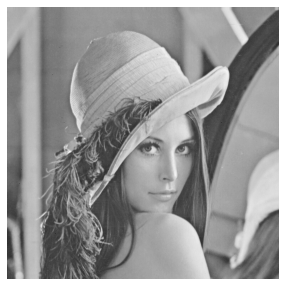

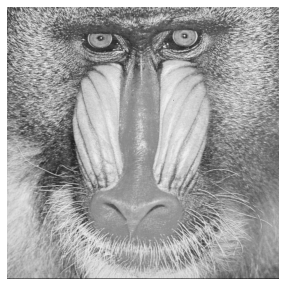

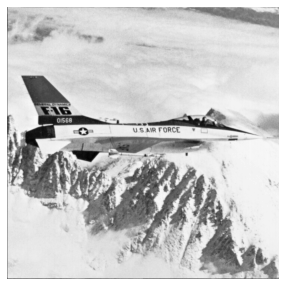

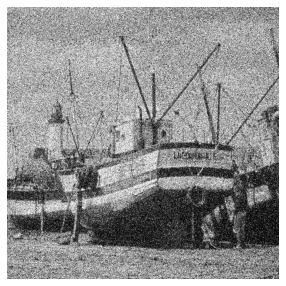

In [20]:
'''
0. Read Image
'''

BASE_DIR = "../Data/Hw3/data/"

LENA_ORI = Read_Tool.read_and_draw(f"{BASE_DIR}lena.raw", "raw")
BABOON_ORI = Read_Tool.read_and_draw(f"{BASE_DIR}baboon.raw", "raw")
F16_ORI = Read_Tool.read_and_draw(f"{BASE_DIR}F16.raw", "raw")
NOISY_ORI = Read_Tool.read_and_draw(f"{BASE_DIR}Noisy.raw", "raw")

==========Lena==========


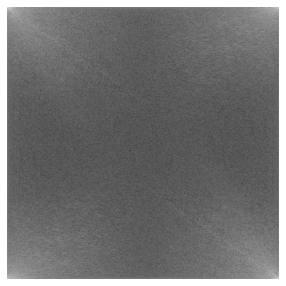

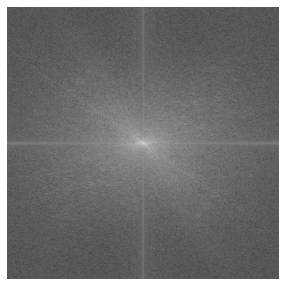

100%|█████████████████████████████████████████| 256/256 [03:33<00:00,  1.20it/s]


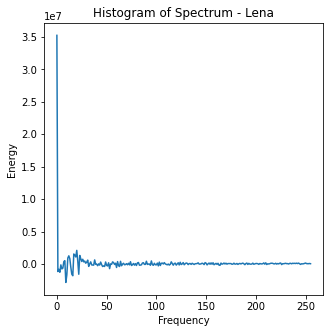

==========Baboon==========


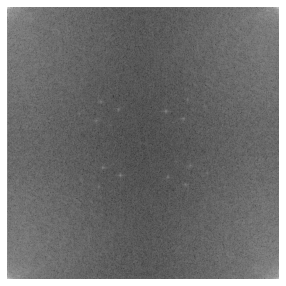

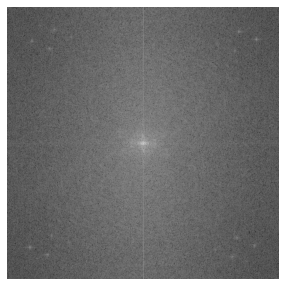

100%|█████████████████████████████████████████| 256/256 [03:31<00:00,  1.21it/s]


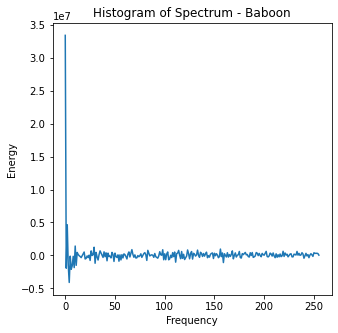

==========F16==========


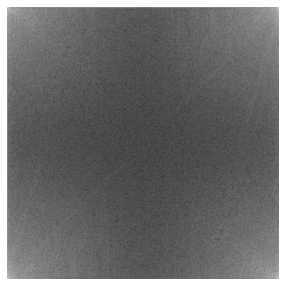

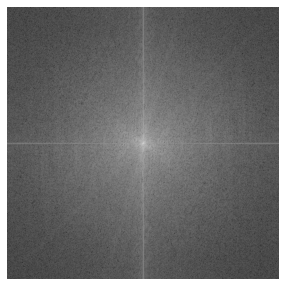

100%|█████████████████████████████████████████| 256/256 [03:32<00:00,  1.21it/s]


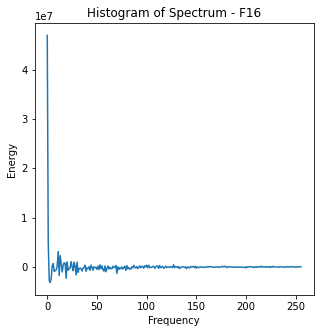

==========Noisy==========


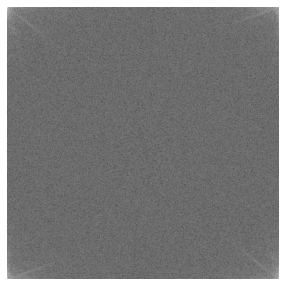

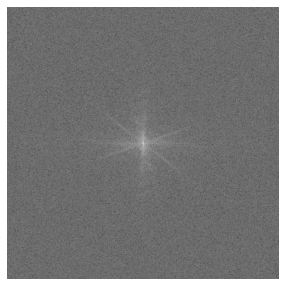

100%|█████████████████████████████████████████| 256/256 [03:31<00:00,  1.21it/s]


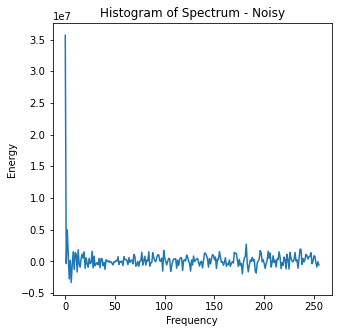

In [29]:
'''
1. (i), (ii), (iii): Fourier Transform
'''

FOUR_NAME = ["Lena", "Baboon", "F16", "Noisy"]
FOUR_IMGS = [LENA_ORI, BABOON_ORI, F16_ORI, NOISY_ORI]

for img, name in zip(FOUR_IMGS, FOUR_NAME):
    
    print(f"=========={name}==========")
    
    # Perform FT
    fft_img = FT_Tool.FFT_2D(img)

    # Center the FFT Image
    centered_fft_img = FT_Tool.fftshift(fft_img)

    # Draw FFT Image
    FT_Tool.plot_fft_img(fft_img)

    # Draw Centered FFT Image
    FT_Tool.plot_fft_img(centered_fft_img)

    # Analyze Centered FFT Image
    real_list = []
    for i in tqdm(range(256)):

        Ring = Filter_Tool.ringPass( i-1, i, (512, 512))
        Result = Ring * centered_fft_img
        real_list.append(sum(sum(np.real(Result))))
        
    plt.figure(figsize=(5,5))
    plt.plot(real_list)
    plt.title(f"Histogram of Spectrum - {name}")
    plt.ylabel("Energy")
    plt.xlabel("Frequency")
    plt.show()

= = = = = Gaussian Noise (mean = 0, std. =  1) = = = = 


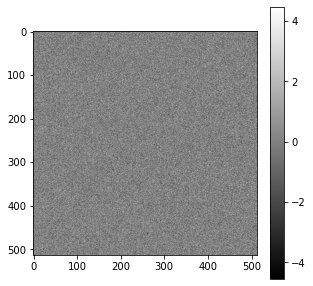

[Lena] Add Noise: Gaussian Noise (mean = 0, std. =  1)


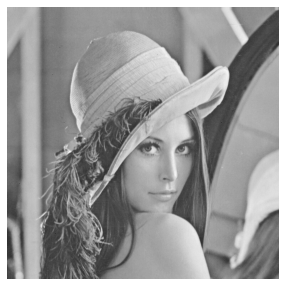

+ + + + + [Lena] Use Ideal Low Pass with D0 = 50 + + + + +


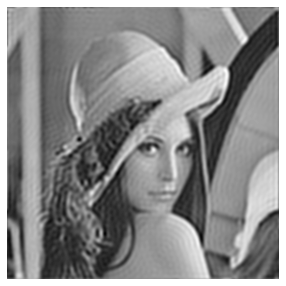

+ + + + + [Lena] Use Gaussian Low Pass with D0 = 50 + + + + +


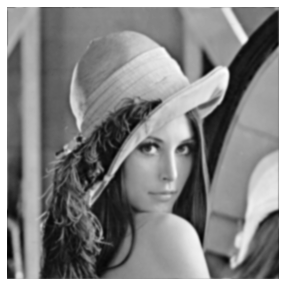

= = = = = Gaussian Noise (mean = 0, std. = 10) = = = = 


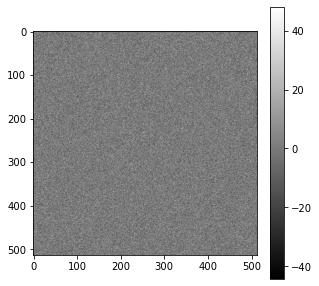

[Lena] Add Noise: Gaussian Noise (mean = 0, std. = 10)


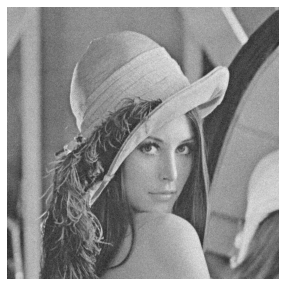

+ + + + + [Lena] Use Ideal Low Pass with D0 = 50 + + + + +


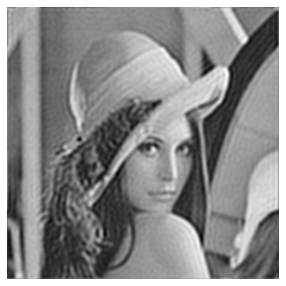

+ + + + + [Lena] Use Gaussian Low Pass with D0 = 50 + + + + +


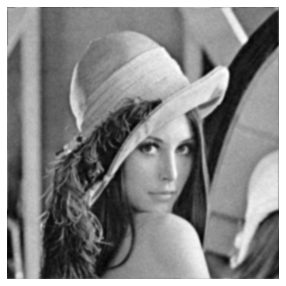

= = = = = Gaussian Noise (mean = 0, std. = 30) = = = = 


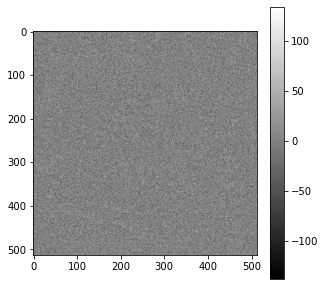

[Lena] Add Noise: Gaussian Noise (mean = 0, std. = 30)


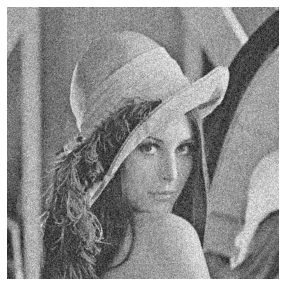

+ + + + + [Lena] Use Ideal Low Pass with D0 = 50 + + + + +


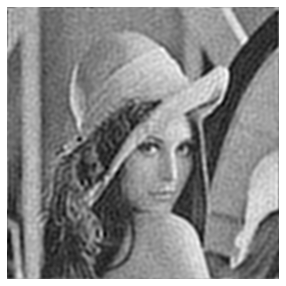

+ + + + + [Lena] Use Gaussian Low Pass with D0 = 50 + + + + +


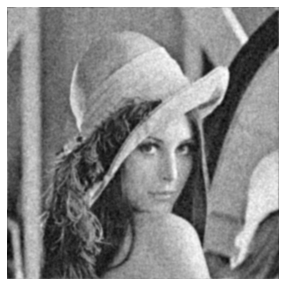

= = = = = Uniform Noise (lower bound =  -1, upper bound =  1) = = = = 


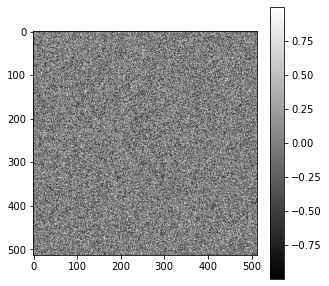

[Lena] Add Noise: Uniform Noise (lower bound =  -1, upper bound =  1)


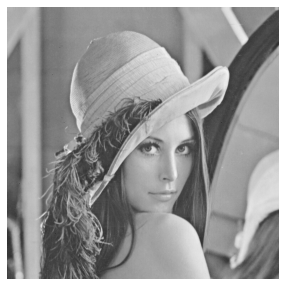

+ + + + + [Lena] Use Ideal Low Pass with D0 = 50 + + + + +


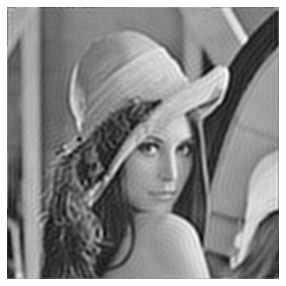

+ + + + + [Lena] Use Gaussian Low Pass with D0 = 50 + + + + +


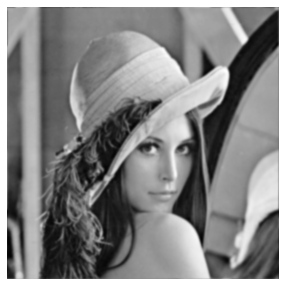

= = = = = Uniform Noise (lower bound = -10, upper bound = 10) = = = = 


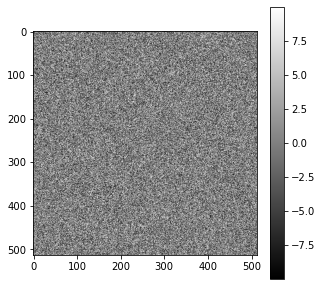

[Lena] Add Noise: Uniform Noise (lower bound = -10, upper bound = 10)


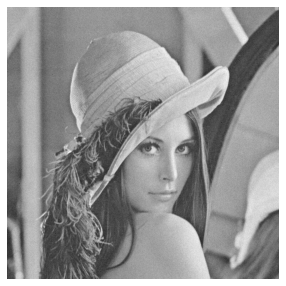

+ + + + + [Lena] Use Ideal Low Pass with D0 = 50 + + + + +


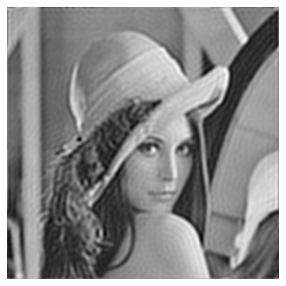

+ + + + + [Lena] Use Gaussian Low Pass with D0 = 50 + + + + +


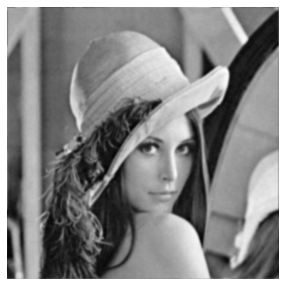

= = = = = Uniform Noise (lower bound = -30, upper bound = 30) = = = = 


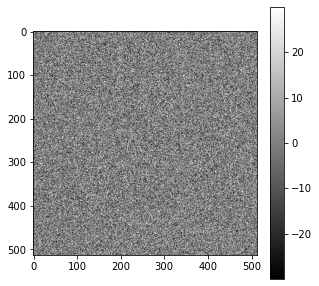

[Lena] Add Noise: Uniform Noise (lower bound = -30, upper bound = 30)


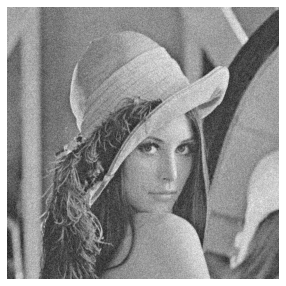

+ + + + + [Lena] Use Ideal Low Pass with D0 = 50 + + + + +


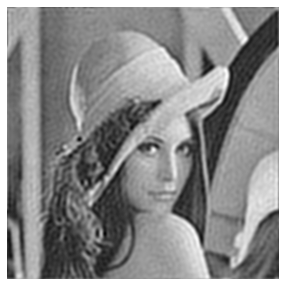

+ + + + + [Lena] Use Gaussian Low Pass with D0 = 50 + + + + +


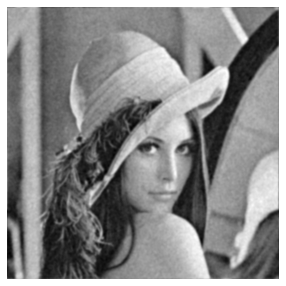

= = = = = Gaussian Noise (mean = 0, std. =  1) = = = = 


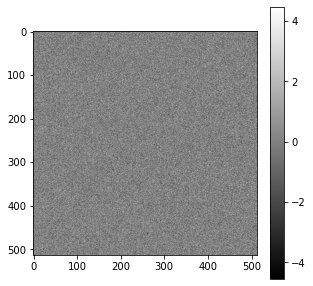

[Baboon] Add Noise: Gaussian Noise (mean = 0, std. =  1)


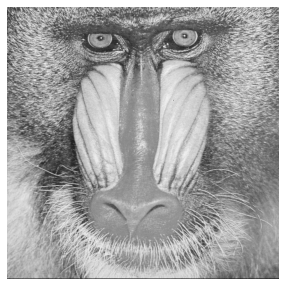

+ + + + + [Baboon] Use Ideal Low Pass with D0 = 50 + + + + +


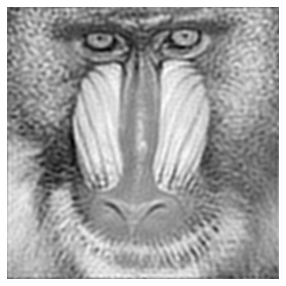

+ + + + + [Baboon] Use Gaussian Low Pass with D0 = 50 + + + + +


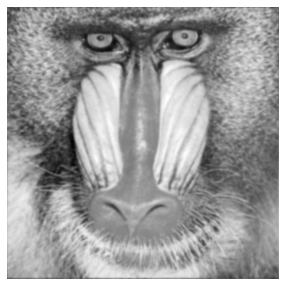

= = = = = Gaussian Noise (mean = 0, std. = 10) = = = = 


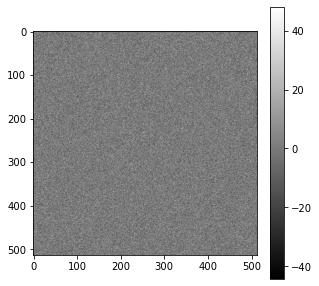

[Baboon] Add Noise: Gaussian Noise (mean = 0, std. = 10)


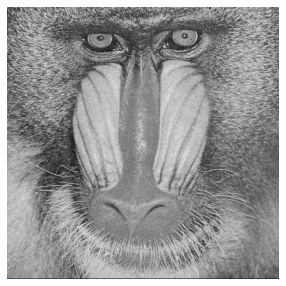

+ + + + + [Baboon] Use Ideal Low Pass with D0 = 50 + + + + +


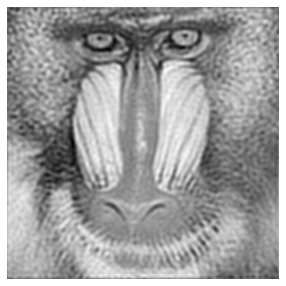

+ + + + + [Baboon] Use Gaussian Low Pass with D0 = 50 + + + + +


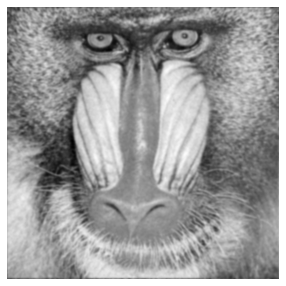

= = = = = Gaussian Noise (mean = 0, std. = 30) = = = = 


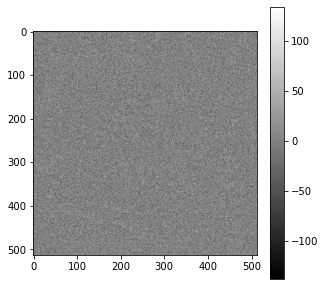

[Baboon] Add Noise: Gaussian Noise (mean = 0, std. = 30)


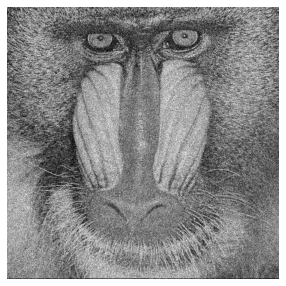

+ + + + + [Baboon] Use Ideal Low Pass with D0 = 50 + + + + +


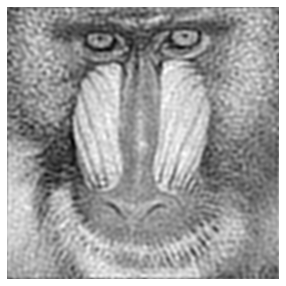

+ + + + + [Baboon] Use Gaussian Low Pass with D0 = 50 + + + + +


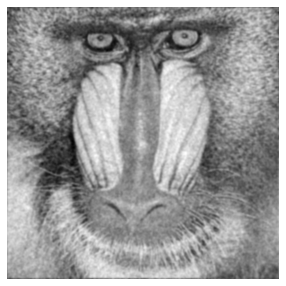

= = = = = Uniform Noise (lower bound =  -1, upper bound =  1) = = = = 


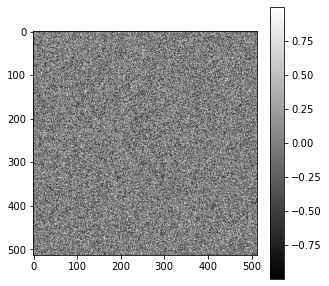

[Baboon] Add Noise: Uniform Noise (lower bound =  -1, upper bound =  1)


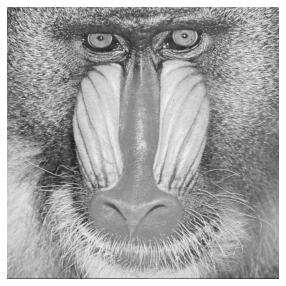

+ + + + + [Baboon] Use Ideal Low Pass with D0 = 50 + + + + +


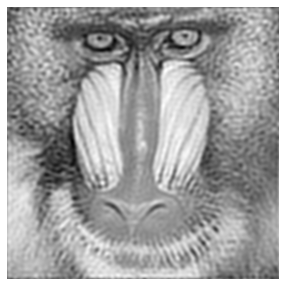

+ + + + + [Baboon] Use Gaussian Low Pass with D0 = 50 + + + + +


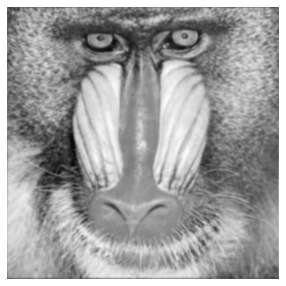

= = = = = Uniform Noise (lower bound = -10, upper bound = 10) = = = = 


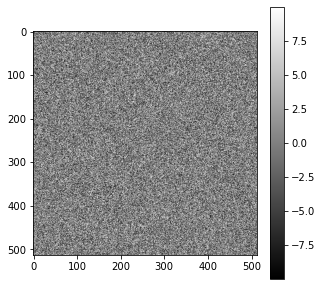

[Baboon] Add Noise: Uniform Noise (lower bound = -10, upper bound = 10)


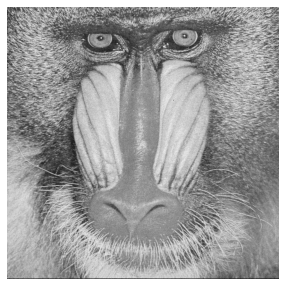

+ + + + + [Baboon] Use Ideal Low Pass with D0 = 50 + + + + +


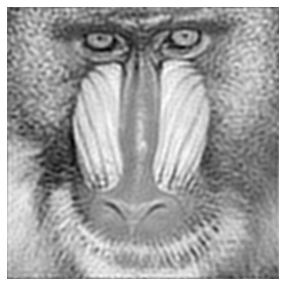

+ + + + + [Baboon] Use Gaussian Low Pass with D0 = 50 + + + + +


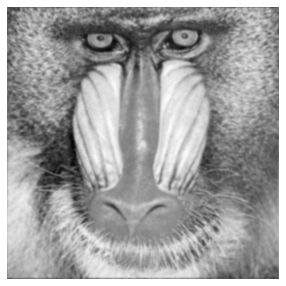

= = = = = Uniform Noise (lower bound = -30, upper bound = 30) = = = = 


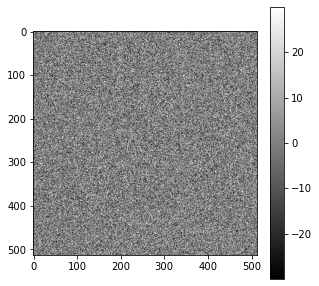

[Baboon] Add Noise: Uniform Noise (lower bound = -30, upper bound = 30)


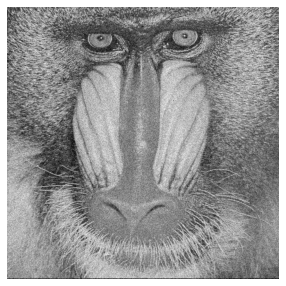

+ + + + + [Baboon] Use Ideal Low Pass with D0 = 50 + + + + +


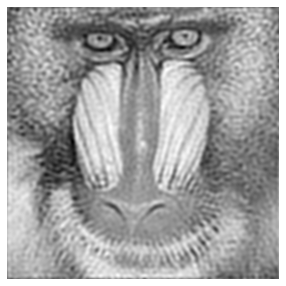

+ + + + + [Baboon] Use Gaussian Low Pass with D0 = 50 + + + + +


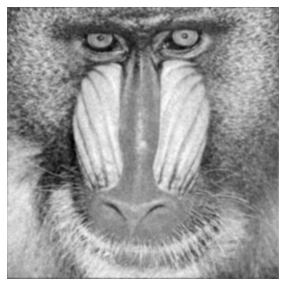

= = = = = Gaussian Noise (mean = 0, std. =  1) = = = = 


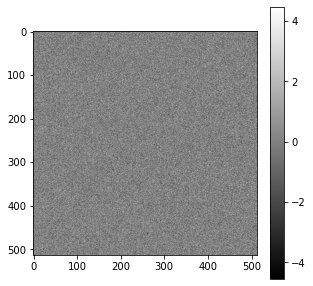

[F16] Add Noise: Gaussian Noise (mean = 0, std. =  1)


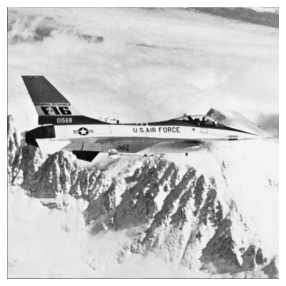

+ + + + + [F16] Use Ideal Low Pass with D0 = 50 + + + + +


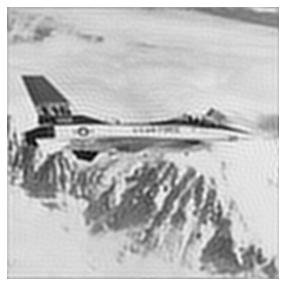

+ + + + + [F16] Use Gaussian Low Pass with D0 = 50 + + + + +


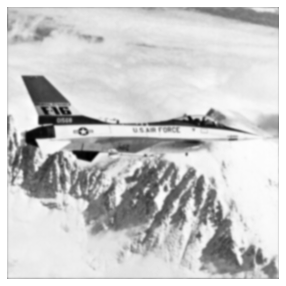

= = = = = Gaussian Noise (mean = 0, std. = 10) = = = = 


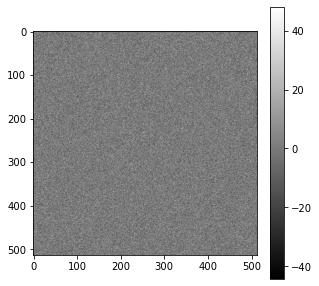

[F16] Add Noise: Gaussian Noise (mean = 0, std. = 10)


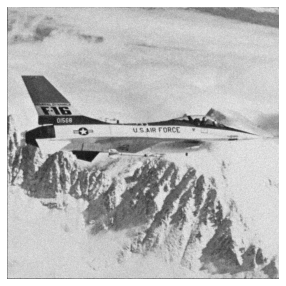

+ + + + + [F16] Use Ideal Low Pass with D0 = 50 + + + + +


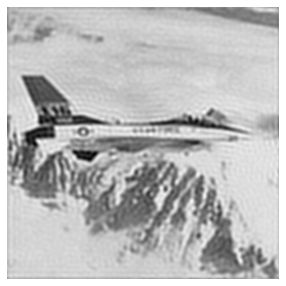

+ + + + + [F16] Use Gaussian Low Pass with D0 = 50 + + + + +


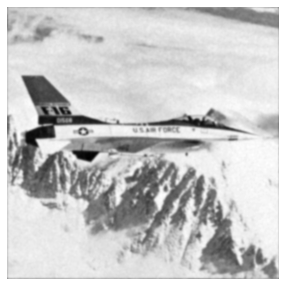

= = = = = Gaussian Noise (mean = 0, std. = 30) = = = = 


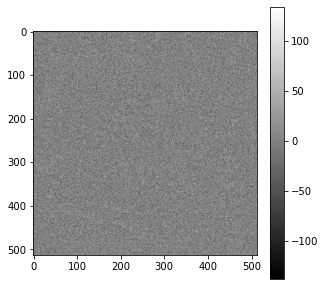

[F16] Add Noise: Gaussian Noise (mean = 0, std. = 30)


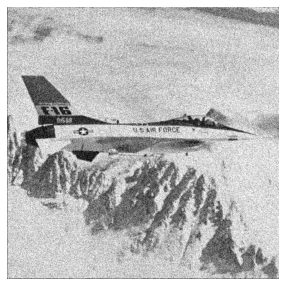

+ + + + + [F16] Use Ideal Low Pass with D0 = 50 + + + + +


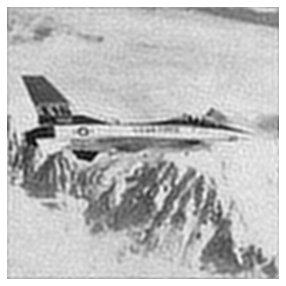

+ + + + + [F16] Use Gaussian Low Pass with D0 = 50 + + + + +


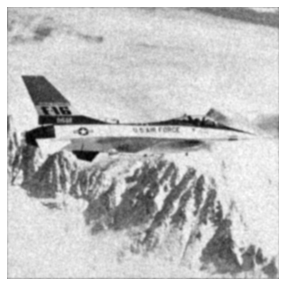

= = = = = Uniform Noise (lower bound =  -1, upper bound =  1) = = = = 


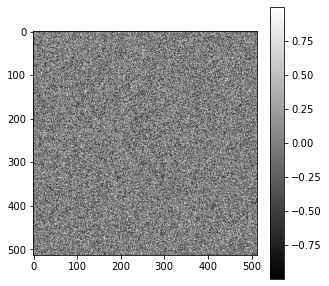

[F16] Add Noise: Uniform Noise (lower bound =  -1, upper bound =  1)


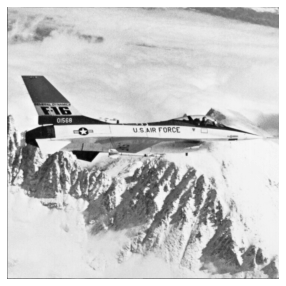

+ + + + + [F16] Use Ideal Low Pass with D0 = 50 + + + + +


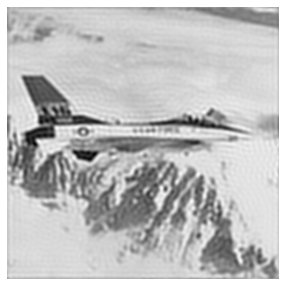

+ + + + + [F16] Use Gaussian Low Pass with D0 = 50 + + + + +


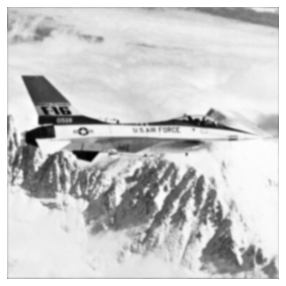

= = = = = Uniform Noise (lower bound = -10, upper bound = 10) = = = = 


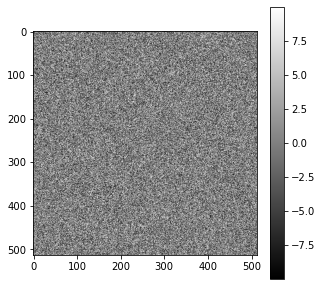

[F16] Add Noise: Uniform Noise (lower bound = -10, upper bound = 10)


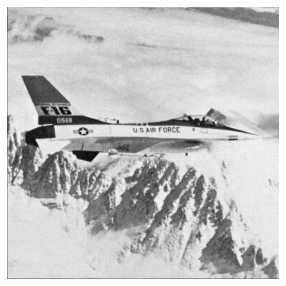

+ + + + + [F16] Use Ideal Low Pass with D0 = 50 + + + + +


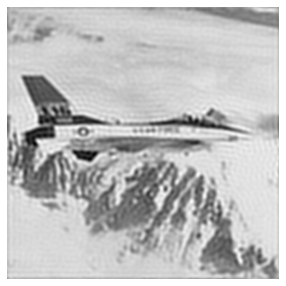

+ + + + + [F16] Use Gaussian Low Pass with D0 = 50 + + + + +


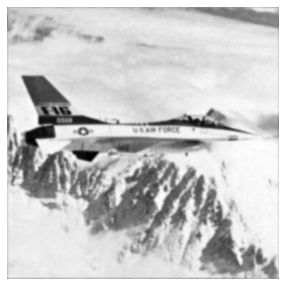

= = = = = Uniform Noise (lower bound = -30, upper bound = 30) = = = = 


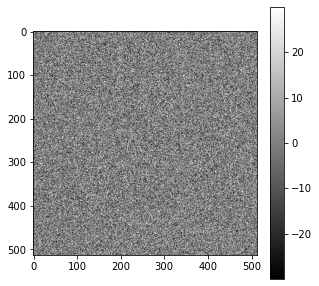

[F16] Add Noise: Uniform Noise (lower bound = -30, upper bound = 30)


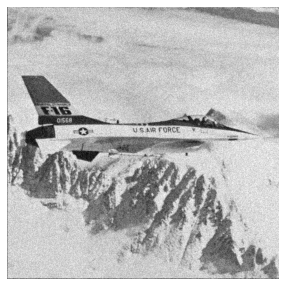

+ + + + + [F16] Use Ideal Low Pass with D0 = 50 + + + + +


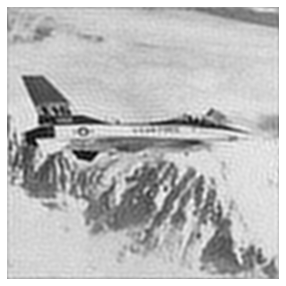

+ + + + + [F16] Use Gaussian Low Pass with D0 = 50 + + + + +


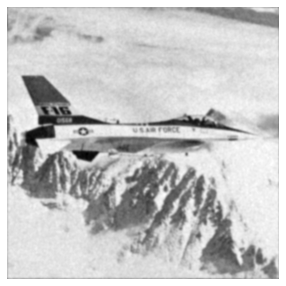

In [50]:
'''
2. (i) Low-pass Filter - Make a Random Noise
2. (ii) Apply the ideal low-pass filter
2. (iii) Apply the Gaussian low-pass filter
'''
THREE_NAME = ["Lena", "Baboon", "F16"]
THREE_IMGS = [LENA_ORI, BABOON_ORI, F16_ORI]

# Gaussian Noise
set_1 = (0,  1)
set_2 = (0, 10)
set_3 = (0, 30)

Gaussian_Noise_Set_1 = Noise_Tool.Gaussian_Noise(mean=set_1[0], sigma=set_1[1])
Gaussian_Noise_Set_2 = Noise_Tool.Gaussian_Noise(mean=set_2[0], sigma=set_2[1])
Gaussian_Noise_Set_3 = Noise_Tool.Gaussian_Noise(mean=set_3[0], sigma=set_3[1])

# Uniform Noise
set_4 = ( -1,  1)
set_5 = (-10, 10)
set_6 = (-30, 30)

Uniform_Noise_Set_1 = Noise_Tool.Uniform_Noise(lower_bound=set_4[0], upper_bound=set_4[1])
Uniform_Noise_Set_2 = Noise_Tool.Uniform_Noise(lower_bound=set_5[0], upper_bound=set_5[1])
Uniform_Noise_Set_3 = Noise_Tool.Uniform_Noise(lower_bound=set_6[0], upper_bound=set_6[1])

NOISE_NAME_LIST = ["Gaussian Noise (mean = 0, std. =  1)", 
                   "Gaussian Noise (mean = 0, std. = 10)", 
                   "Gaussian Noise (mean = 0, std. = 30)", 
                   "Uniform Noise (lower bound =  -1, upper bound =  1)",
                   "Uniform Noise (lower bound = -10, upper bound = 10)",
                   "Uniform Noise (lower bound = -30, upper bound = 30)"]

NOISE_LIST = [Gaussian_Noise_Set_1, 
              Gaussian_Noise_Set_2, 
              Gaussian_Noise_Set_3,
              Uniform_Noise_Set_1,
              Uniform_Noise_Set_2,
              Uniform_Noise_Set_3]

# Ideal Low-pass Params
D0_ILP = 50
# Gaussian Low-pass Params
D0_GLP = 50

for IMG, img_name in zip(THREE_IMGS, THREE_NAME):

    for noise, name in zip(NOISE_LIST, NOISE_NAME_LIST):

        # Noise Signals
        print(f"= = = = = {name} = = = = ")
        plt.figure(figsize=(5,5))
        plt.imshow(noise, cmap="gray")
        plt.colorbar()
        plt.show()

        img_with_noise = IMG + noise        
        img_with_noise = np.maximum(img_with_noise,   1 * np.zeros(img_with_noise.shape))
        img_with_noise = np.minimum(img_with_noise, 255 * np.ones(img_with_noise.shape))

        print(f"[{img_name}] Add Noise: {name}")
        plt.figure(figsize=(5,5))
        plt.imshow(img_with_noise, cmap="gray")
        plt.axis("off")
        plt.show()
    
        # FFT on img_with_noise
        fft_img = FT_Tool.FFT_2D(img_with_noise)
        
        # Flip
        fft_centered = FT_Tool.fftshift(fft_img)
        
        # Use Ideal Low-Pass
        ideal_low_pass = Filter_Tool.perfectLP(D0_ILP, (512,512))
        fft_used_ILP = ideal_low_pass * fft_centered
        
        # Use Gaussian Low-Pass
        gaussian_low_pass = Filter_Tool.gaussianLP(D0_GLP, (512,512))
        fft_used_GLP = gaussian_low_pass * fft_centered
        
        # Flip back
        fft_used_ILP = FT_Tool.fftshift(fft_used_ILP)
        fft_used_GLP = FT_Tool.fftshift(fft_used_GLP)
        
        # Inverse FFT
        img_used_ILP = FT_Tool.inverseFFT_2D(fft_used_ILP)
        img_used_GLP = FT_Tool.inverseFFT_2D(fft_used_GLP)
        
        # Plot IMG
        print(f"+ + + + + [{img_name}] Use Ideal Low Pass with D0 = {D0_ILP} + + + + +")
        plt.figure(figsize=(5,5))
        plt.imshow(img_used_ILP, cmap="gray")
        plt.axis("off")
        plt.show()
        
        print(f"+ + + + + [{img_name}] Use Gaussian Low Pass with D0 = {D0_GLP} + + + + +")
        plt.figure(figsize=(5,5))
        plt.imshow(img_used_GLP, cmap="gray")
        plt.axis("off")
        plt.show()

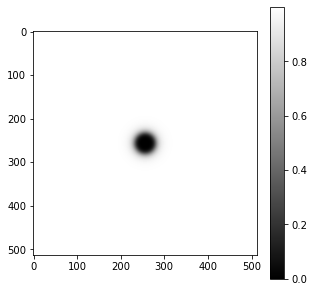

+ + + + + [Lena] Use Butterworth High Pass with D0 = 25, n = 3 + + + + +


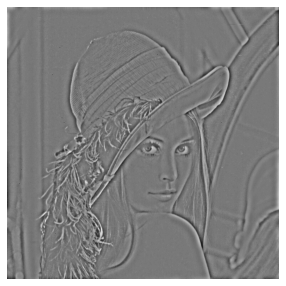

+ + + + + [Lena] Use Laplacian Filter with kernel size = 3 + + + + +


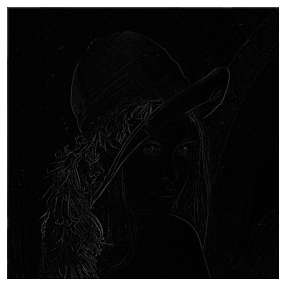

+ + + + + [Baboon] Use Butterworth High Pass with D0 = 25, n = 3 + + + + +


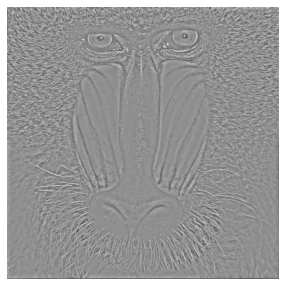

+ + + + + [Baboon] Use Laplacian Filter with kernel size = 3 + + + + +


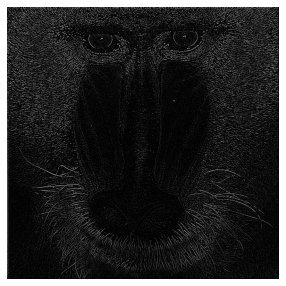

+ + + + + [F16] Use Butterworth High Pass with D0 = 25, n = 3 + + + + +


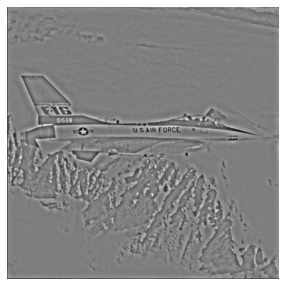

+ + + + + [F16] Use Laplacian Filter with kernel size = 3 + + + + +


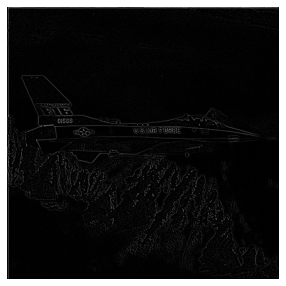

+ + + + + [Noisy] Use Butterworth High Pass with D0 = 25, n = 3 + + + + +


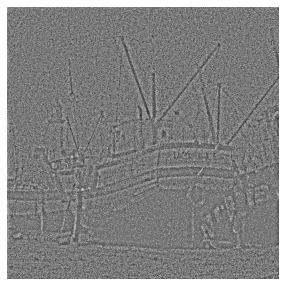

+ + + + + [Noisy] Use Laplacian Filter with kernel size = 3 + + + + +


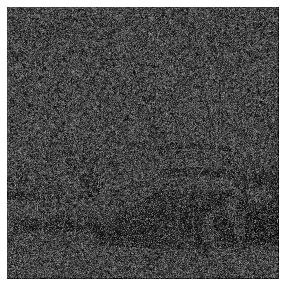

In [58]:
'''
3. High-Pass Filter - Butterworth high-pass (Frequency Domain) and Laplacian Filter (Spatial Domain)
'''

FOUR_NAME = ["Lena", "Baboon", "F16", "Noisy"]
FOUR_IMGS = [LENA_ORI, BABOON_ORI, F16_ORI, NOISY_ORI]


# Butterworth High-Pass Filter
D0_BHP = 25
n = 3

# Laplacian Filter
kernel_size = 3 # {3,5,7}

# Plot Butterworth High-Pass Filter
butterworth_high_pass_filter =Filter_Tool.butterworthHP(D0_BHP, n, (512, 512))
plt.figure(figsize=(5,5))
plt.imshow(butterworth_high_pass_filter, cmap="gray")
plt.colorbar()
plt.show()

for img, img_name in zip(FOUR_IMGS, FOUR_NAME):
    
    # Frequency Domain -> Butterworth High-Pass Filter
    fft_img = FT_Tool.FFT_2D(img)
    fft_centered = FT_Tool.fftshift(fft_img)
    
    fft_used_BHP = fft_centered * butterworth_high_pass_filter
    fft_used_BHP = FT_Tool.fftshift(fft_used_BHP)
    img_BHP = FT_Tool.inverseFFT_2D(fft_used_BHP)
    
    print(f"+ + + + + [{img_name}] Use Butterworth High Pass with D0 = {D0_BHP}, n = {n} + + + + +")
    plt.figure(figsize=(5,5))
    plt.imshow(img_BHP, cmap="gray")
    plt.axis("off")
    plt.show()
    
    # Spatial Domain -> Lapalcian Filter
    img_used_Laplace_kernel = Filter_Tool.LaplacianFilter(img, kernel_size)
    print(f"+ + + + + [{img_name}] Use Laplacian Filter with kernel size = {kernel_size} + + + + +")
    plt.figure(figsize=(5,5))
    plt.imshow(img_used_Laplace_kernel, cmap="gray")
    plt.axis("off")
    plt.show()

This is our target. (i.e., Noisy.raw)


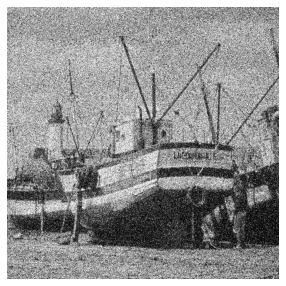

Use Gaussian Filter with Sigma = 0.01


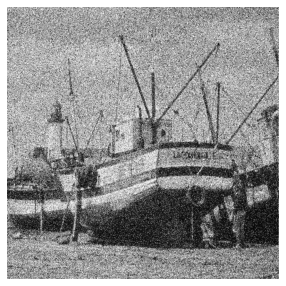

Use Gaussian Filter with Sigma = 0.1


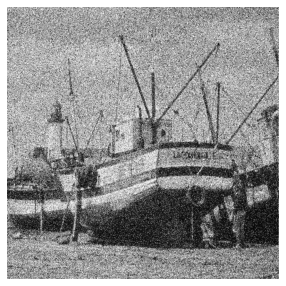

Use Gaussian Filter with Sigma = 0.6


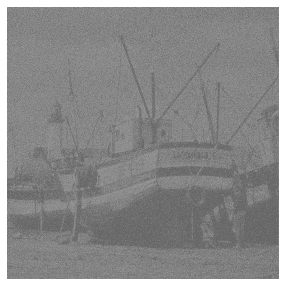

Use Wiener Filter with K = 0.001


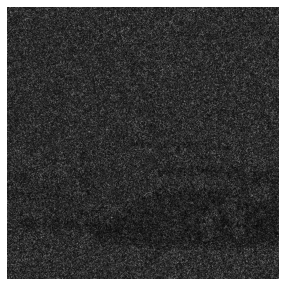

Use Wiener Filter with K = 0.1


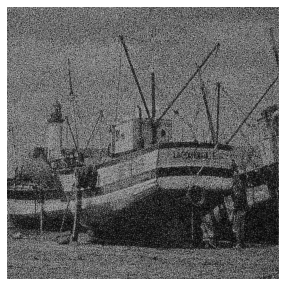

Use Wiener Filter with K = 10.0


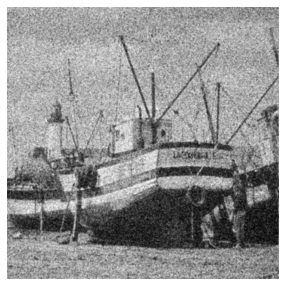

In [70]:
"""
4.  (i) Inverse Filter
4. (ii) Wiener Filter
"""

print("This is our target. (i.e., Noisy.raw)")
plt.figure(figsize=(5,5))
plt.imshow(NOISY_ORI, cmap="gray")
plt.axis("off")
plt.show()

""" Inverse Filter """
#
# Formula of Inverse Filter #
#
# F(u,v) = G(u,v) / H(u,v)
    # F(u,v): result after applying H(u,v)
    # G(u,v): result after applying F.T. on g(x,y)
    # H(u,v): F.T. of the Gaussian

sigma_set_1 = 0.01
sigma_set_2 = 0.1
sigma_set_3 = 0.6

for sigma in [sigma_set_1, sigma_set_2, sigma_set_3]:
    print(f"Use Gaussian Filter with Sigma = {sigma}")
    h = gaussian(3, sigma).reshape(3, 1)
    h = np.dot(h, h.transpose())
    h /= np.sum(h)

    gaussian_kernel = h
    kernel_final = np.zeros(img.shape)
    h, w = gaussian_kernel.shape
    kernel_final[:h,:w] = gaussian_kernel

    kernel_final /= np.sum(kernel_final)
    kernel_FFT = FT_Tool.FFT_2D(kernel_final)
    img_FFT = FT_Tool.FFT_2D(img)

    ans = img_FFT/kernel_FFT
    out = FT_Tool.inverseFFT_2D(ans)
    plt.figure(figsize=(5,5))
    plt.imshow(out, cmap="gray")
    plt.axis("off")
    plt.show()


""" Wiener Filter """
#
# Formula of Wiener Filter
#
# F(u,v) = W(u,v) * G(u,v) , where W(u,v) = H*(u,v) / |H(u,v)|**2 + K(u,v)

K_list = [1e-3,1e-1,1e1]

for K in K_list:
    print(f"Use Wiener Filter with K = {K}")
    gaussian_kernel = FT_Tool.gaussian_kernel(kernel_size=3)
    img_use_wiener_filter = FT_Tool.wiener_filter(NOISY_ORI, gaussian_kernel, K)
    plt.figure(figsize=(5,5))
    plt.imshow(img_use_wiener_filter, cmap="gray")
    plt.axis("off")
    plt.show()

# (TODO) BM3D

# (TODO) Guided Filter

This is our target. (i.e., Noisy.raw)


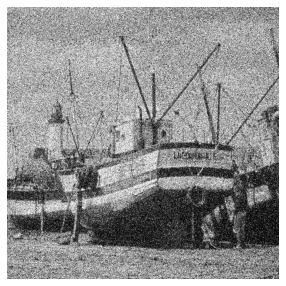

100%|█████████████████████████████████████████| 512/512 [01:14<00:00,  6.91it/s]


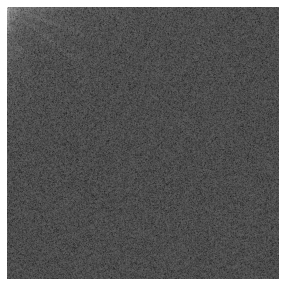

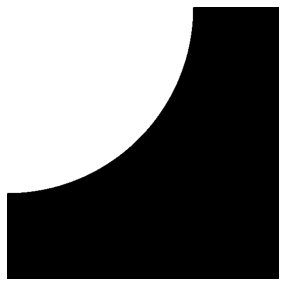

100%|█████████████████████████████████████████| 512/512 [01:43<00:00,  4.94it/s]


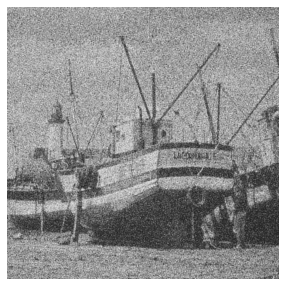

In [73]:
'''
(5) Discrete Cosine Transform
'''

print("This is our target. (i.e., Noisy.raw)")
plt.figure(figsize=(5,5))
plt.imshow(NOISY_ORI, cmap="gray")
plt.axis("off")
plt.show()

dct_img = CT_Tool.dct_2d(NOISY_ORI)
FT_Tool.plot_fft_img(dct_img)

D0_DCT=350
mask = Filter_Tool.perfectLP_TopLeft(D0_DCT, (512,512))
plt.figure(figsize=(5,5))
plt.imshow(mask, cmap="gray")
plt.axis("off")
plt.show()

test = mask * dct_img
back = CT_Tool.idct_2d(test)

plt.figure(figsize=(5,5))
plt.imshow(back, cmap="gray")
plt.axis("off")
plt.show()

# 也許可以用來參考

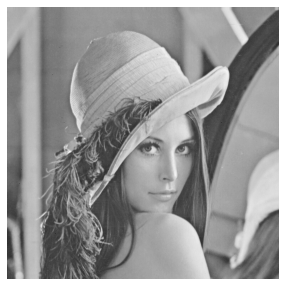

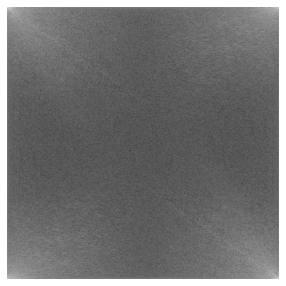

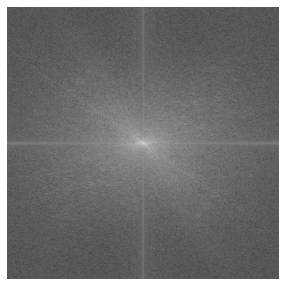

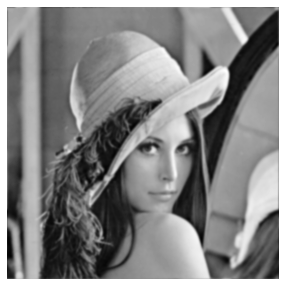

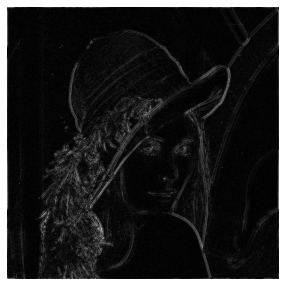

...

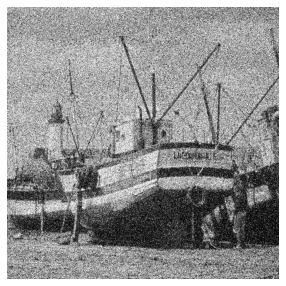

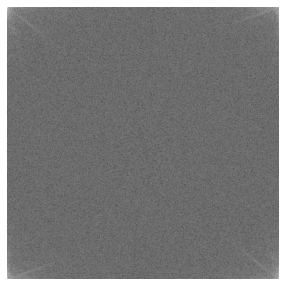

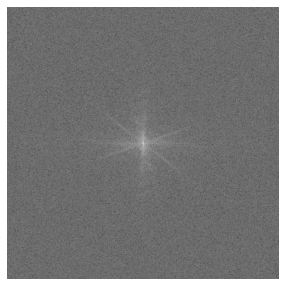

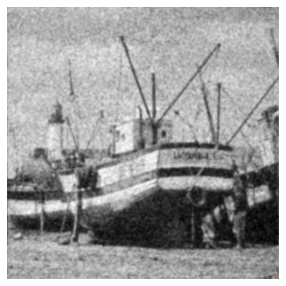

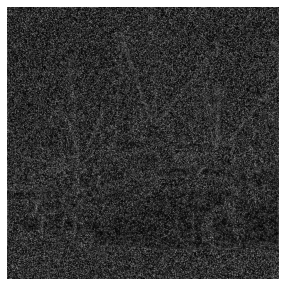

In [9]:
for fname in FILENAME_LIST:
    # Read Image
    fname = f"{BASE_DIR}{fname}"
    mode = fname[-3:]
    img = jjcv_rd.read_and_draw(fname, mode)
    
    # FFT Transform
    original = np.fft.fft2(img)
    plt.figure(figsize=(5,5))
    plt.imshow(np.log(1+np.abs(original)), cmap="gray")
    plt.axis("off")
    plt.show()
    
    # Shift
    center = np.fft.fftshift(original)
    plt.figure(figsize=(5,5))
    plt.imshow(np.log(1+np.abs(center)), cmap="gray")
    plt.axis("off")
    plt.show()
    
    # Filter in frequency domain
    LowPassCenter = center * gaussianLP(50, img.shape)
    LowPass = np.fft.ifftshift(LowPassCenter)
    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.figure(figsize=(5,5))
    plt.imshow(np.abs(inverse_LowPass), cmap="gray")
    plt.axis("off")
    plt.show()
    
    # Reverse Back
    HighPassCenter = center * gaussianHP(50, img.shape)
    HighPass = np.fft.ifftshift(HighPassCenter)
    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.figure(figsize=(5,5))
    plt.imshow(np.abs(inverse_HighPass), cmap="gray")
    plt.axis("off")
    plt.show()